# GAN Assignment
- This model is trained on 30k images with each image resized to (64, 64, 3)
- Model is trained for 20000 epochs repeatedly.

## Import necessary modules

In [1]:
import os
import time

import numpy as np
import pandas as pd
from PIL import Image
from tqdm import tqdm
import zipfile
from matplotlib import pyplot as plt

import tensorflow as tf
from tensorflow.keras import layers

## Mount drive for reading data

In [2]:
from google.colab import drive
drive.mount('/content/drive/', force_remount = True)

Mounted at /content/drive/


## Extract zipped images

In [3]:
data_dir = "/content/drive/MyDrive/Celeb_A/archive.zip"
extract_dir = '/tmp/'
zip_ref = zipfile.ZipFile(data_dir, 'r')
zip_ref.extractall(extract_dir)
zip_ref.close()

### Path of the extracted images

In [4]:
image_path = extract_dir + '/img_align_celeba/img_align_celeba'
print(f"Number of images in the dataset: {len(os.listdir(image_path))}")

Number of images in the dataset: 202599


## Declaration of global variables

In [5]:
# latent dimension for the generator model
Z_DIM = 100
CHANNELS = 3

# number of images to train gan
NUM_IMAGES = 30000

# original dimension of the images
ORIGINAL_WIDTH = 178
ORIGINAL_HEIGHT = 218
DIFF = (ORIGINAL_HEIGHT - ORIGINAL_WIDTH) // 2

# dimension of images after reshaping
WIDTH = 64
HEIGHT = 64

## Reshaping images from (218, 178, 3) to (64, 64, 3)

In [6]:
cropped_area = (0, DIFF, ORIGINAL_WIDTH, ORIGINAL_HEIGHT - DIFF)

images = []
for file in tqdm(os.listdir(image_path)[:NUM_IMAGES]):
  img = Image.open(os.path.join(image_path, file)).crop(cropped_area)
  img.thumbnail((WIDTH, HEIGHT), Image.ANTIALIAS)
  images.append(np.uint8(img))

# rescale image pixels in the range (0-1)
images = np.array(images) / 255.0

print(f'Shape of images array: {images.shape}')

100%|██████████| 30000/30000 [00:43<00:00, 693.84it/s]


Shape of images array: (30000, 64, 64, 3)


### Display few images

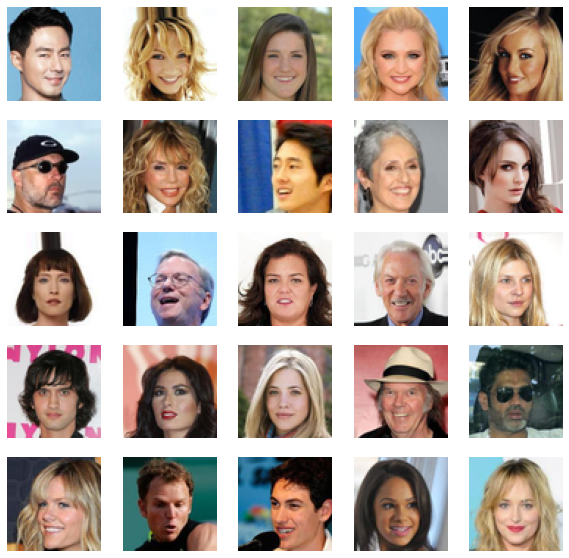

In [7]:
plt.figure(1, figsize = (10, 10))
for i in range(25):
  plt.subplot(5, 5, i + 1)
  plt.imshow(images[i])
  plt.axis('off')
plt.show()

### Create generator model 

In [8]:
def generator_model(noise_dim = Z_DIM):
  inputs = layers.Input(shape = (Z_DIM,))
  
  x = layers.Dense(256 * 8 * 8)(inputs)
  x = layers.LeakyReLU()(x)
  x = layers.Reshape((8, 8, 256))(x)
  
  x = layers.Conv2D(256, (5, 5), padding = 'same')(x)
  x = layers.LeakyReLU()(x)
  
  x = layers.Conv2DTranspose(256, (4, 4), strides = (2, 2), padding = 'same')(x)
  x = layers.LeakyReLU()(x)
  
  x = layers.Conv2DTranspose(256, (4, 4), strides = (2, 2), padding = 'same')(x)
  x = layers.LeakyReLU()(x)
  
  x = layers.Conv2DTranspose(256, (4, 4), strides = (2, 2), padding = 'same')(x)
  x = layers.LeakyReLU()(x)
  
  x = layers.Conv2D(512, (5, 5), padding = 'same')(x)
  x = layers.LeakyReLU()(x)
  
  x = layers.Conv2D(512, (5, 5), padding = 'same')(x)
  
  x = layers.LeakyReLU()(x)
  img = layers.Conv2D(CHANNELS, (7, 7), activation = 'tanh', padding = 'same')(x)
  
  model = tf.keras.Model(inputs = inputs, outputs = img)
  return model

### Create discriminator model

In [9]:
def discriminator_model():
  inputs = layers.Input(shape = (HEIGHT, WIDTH, CHANNELS))
  
  x = layers.Conv2D(256, (3, 3))(inputs)
  x = layers.LeakyReLU()(x)
  
  x = layers.Conv2D(256, (4, 4), strides = (2, 2))(x)
  x = layers.LeakyReLU()(x)
  
  x = layers.Conv2D(256, (4, 4), strides = (2, 2))(x)
  x = layers.LeakyReLU()(x)
  
  x = layers.Conv2D(256, (4, 4), strides = (2, 2))(x)
  x = layers.LeakyReLU()(x)
  
  x = layers.Conv2D(256, (4, 4), strides = (2, 2))(x)
  x = layers.LeakyReLU()(x)
  
  x = layers.Flatten()(x)
  x = layers.Dropout(0.4)(x)
  
  pred = layers.Dense(1, activation = 'sigmoid')(x)
  
  model = tf.keras.Model(inputs = inputs, outputs = pred)
  
  optimizer = tf.keras.optimizers.RMSprop(lr = .0001, clipvalue = 1.0, decay = 1e-8)
  model.compile(optimizer = optimizer, loss = 'binary_crossentropy')
  
  return model

### Create gan model

In [10]:
# create the generator model
generator = generator_model(noise_dim = Z_DIM)

# create the discriminator model
discriminator = discriminator_model()

# freeze discriminator training
discriminator.trainable = False

# create GAN model 
inputs = layers.Input(shape = (Z_DIM, ))
outputs = discriminator(generator(inputs))
gan_model = tf.keras.Model(inputs = inputs, outputs = outputs)

# compile the gan model
optimizer = tf.keras.optimizers.RMSprop(lr = .0001, clipvalue = 1.0, decay = 1e-8)
gan_model.compile(optimizer = optimizer, loss = 'binary_crossentropy')

## Summary of generator model

In [12]:
generator.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 100)]             0         
_________________________________________________________________
dense (Dense)                (None, 16384)             1654784   
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 16384)             0         
_________________________________________________________________
reshape (Reshape)            (None, 8, 8, 256)         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 8, 8, 256)         1638656   
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 8, 8, 256)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 16, 16, 256)       104883

## Summary of discriminator model

In [13]:
discriminator.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 64, 64, 3)]       0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 62, 62, 256)       7168      
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (None, 62, 62, 256)       0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 30, 30, 256)       1048832   
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 30, 30, 256)       0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 14, 14, 256)       1048832   
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 14, 14, 256)       0   

## Summary of GAN model

In [14]:
gan_model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 100)]             0         
_________________________________________________________________
model (Functional)           (None, 64, 64, 3)         16346627  
_________________________________________________________________
model_1 (Functional)         (None, 1)                 4203521   
Total params: 20,550,148
Trainable params: 16,346,627
Non-trainable params: 4,203,521
_________________________________________________________________


## Training Loop
- Trained the model for 37k epochs

50/5000: d_loss: 0.6399,  gan_loss: 0.7227


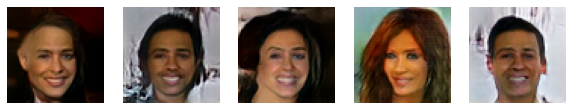

100/5000: d_loss: 0.6864,  gan_loss: 0.7599


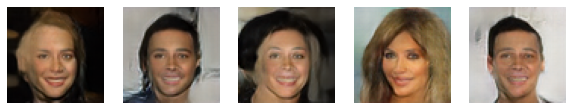

150/5000: d_loss: 0.6725,  gan_loss: 0.8028


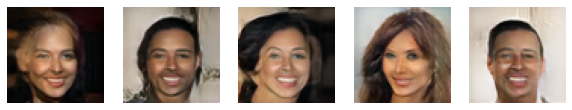

200/5000: d_loss: 0.6970,  gan_loss: 0.8332


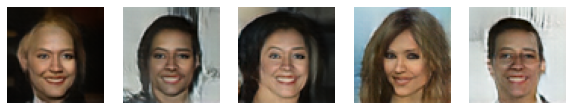

250/5000: d_loss: 0.6656,  gan_loss: 0.7901


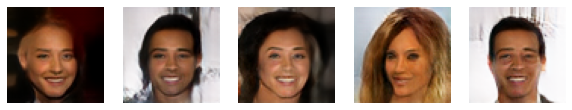

300/5000: d_loss: 0.5938,  gan_loss: 1.0525


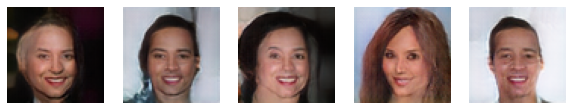

350/5000: d_loss: 0.7310,  gan_loss: 0.8522


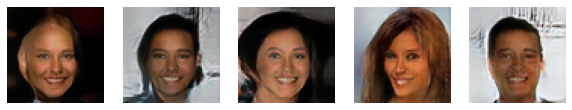

400/5000: d_loss: 0.7285,  gan_loss: 0.9112


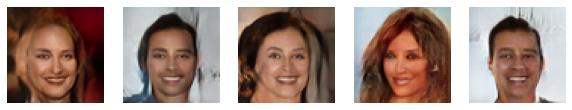

450/5000: d_loss: 0.6508,  gan_loss: 0.8296


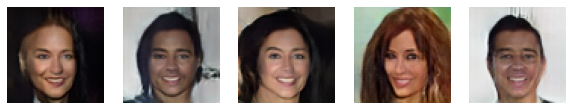

500/5000: d_loss: 0.7378,  gan_loss: 0.8203


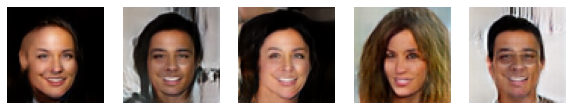

550/5000: d_loss: 0.6970,  gan_loss: 0.7402


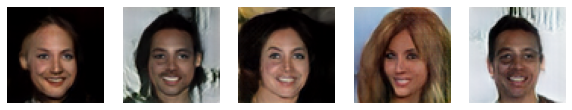

600/5000: d_loss: 0.7005,  gan_loss: 0.7956


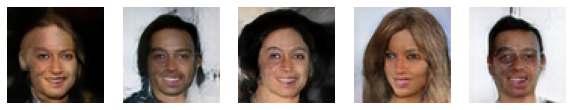

650/5000: d_loss: 0.6699,  gan_loss: 1.0175


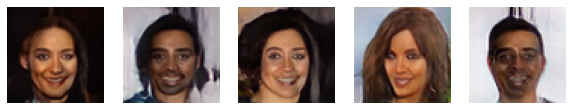

700/5000: d_loss: 0.7215,  gan_loss: 0.7989


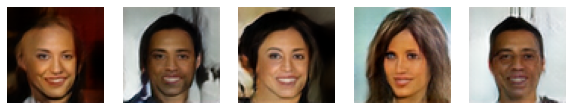

750/5000: d_loss: 0.7739,  gan_loss: 0.9016


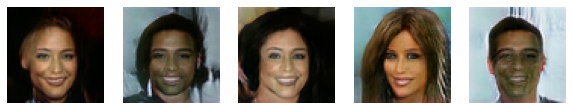

800/5000: d_loss: 0.7285,  gan_loss: 0.7862


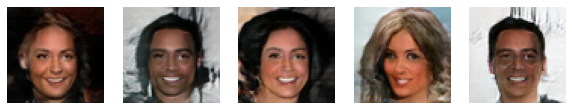

850/5000: d_loss: 0.7106,  gan_loss: 0.7693


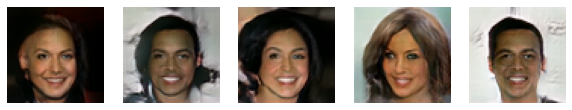

900/5000: d_loss: 0.7144,  gan_loss: 0.8914


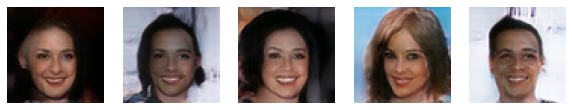

950/5000: d_loss: 0.6942,  gan_loss: 0.9451


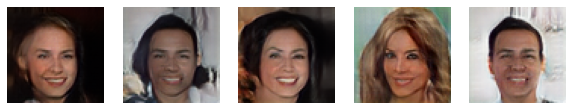

1000/5000: d_loss: 0.7355,  gan_loss: 0.8525


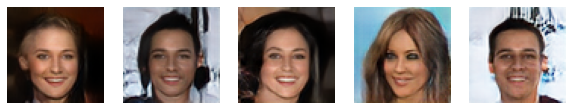

1050/5000: d_loss: 0.6695,  gan_loss: 0.8514


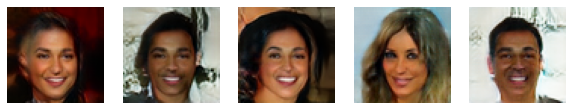

1100/5000: d_loss: 0.7143,  gan_loss: 0.8645


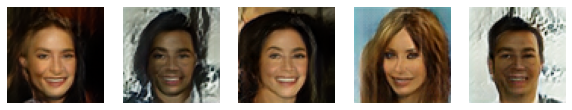

1150/5000: d_loss: 0.6848,  gan_loss: 0.8522


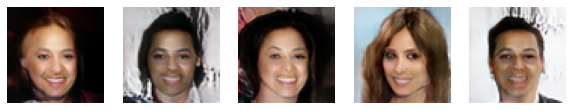

1200/5000: d_loss: 0.6345,  gan_loss: 0.9345


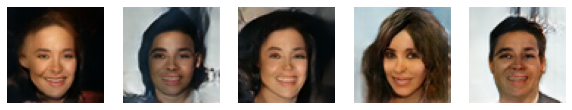

1250/5000: d_loss: 0.6543,  gan_loss: 0.8430


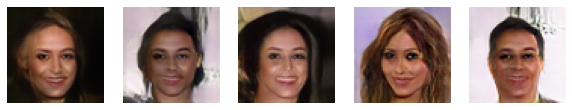

1300/5000: d_loss: 0.6911,  gan_loss: 0.8157


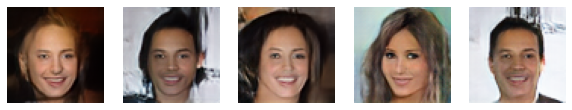

1350/5000: d_loss: 0.6750,  gan_loss: 0.8742


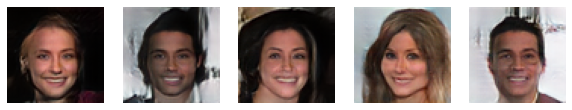

1400/5000: d_loss: 0.6304,  gan_loss: 0.7747


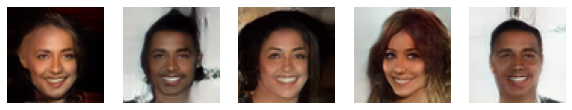

1450/5000: d_loss: 0.6718,  gan_loss: 0.8274


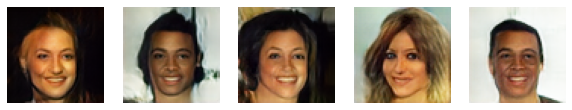

1500/5000: d_loss: 0.6883,  gan_loss: 0.7774


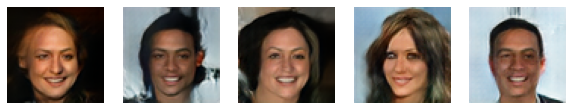

1550/5000: d_loss: 0.7359,  gan_loss: 0.9176


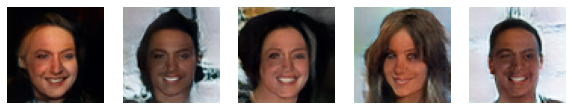

1600/5000: d_loss: 0.7126,  gan_loss: 0.8660


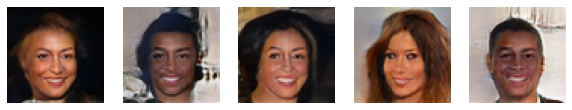

1650/5000: d_loss: 0.7403,  gan_loss: 0.9092


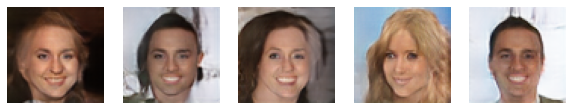

1700/5000: d_loss: 0.7124,  gan_loss: 0.8332


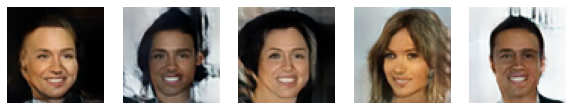

1750/5000: d_loss: 0.6869,  gan_loss: 0.8394


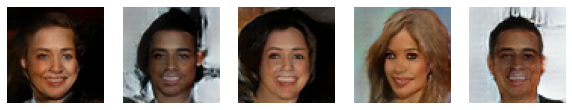

1800/5000: d_loss: 0.6866,  gan_loss: 0.7790


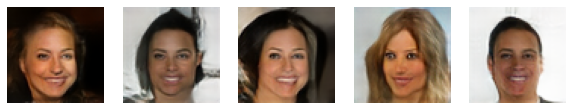

1850/5000: d_loss: 0.7063,  gan_loss: 0.7725


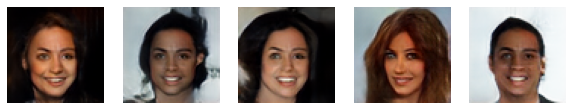

1900/5000: d_loss: 0.6798,  gan_loss: 0.8838


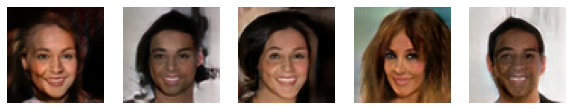

1950/5000: d_loss: 0.7377,  gan_loss: 0.9549


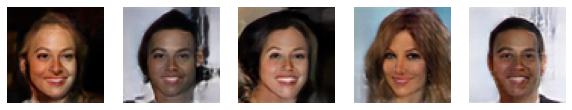

2000/5000: d_loss: 0.6671,  gan_loss: 0.8199


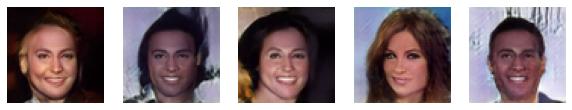

2050/5000: d_loss: 0.7184,  gan_loss: 0.8208


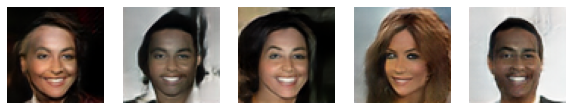

2100/5000: d_loss: 0.6567,  gan_loss: 0.7610


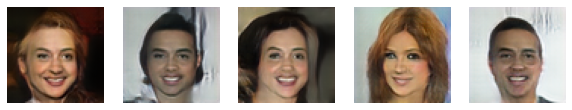

2150/5000: d_loss: 0.6629,  gan_loss: 0.7522


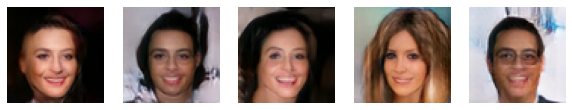

2200/5000: d_loss: 0.6425,  gan_loss: 0.7602


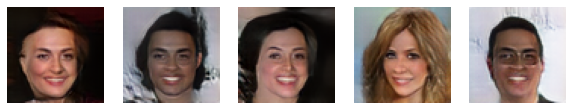

2250/5000: d_loss: 0.6668,  gan_loss: 0.7914


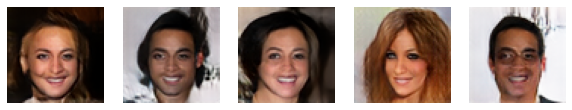

2300/5000: d_loss: 0.6745,  gan_loss: 0.7727


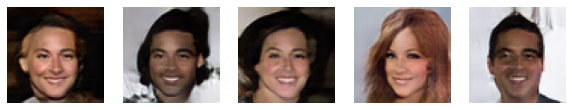

2350/5000: d_loss: 0.7006,  gan_loss: 0.7986


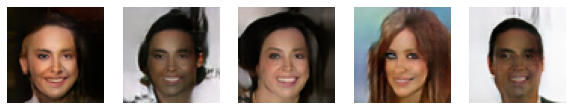

2400/5000: d_loss: 0.6788,  gan_loss: 0.7925


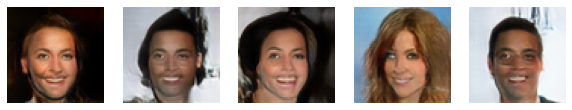

2450/5000: d_loss: 0.6729,  gan_loss: 0.7859


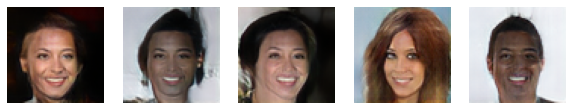

2500/5000: d_loss: 0.6710,  gan_loss: 0.7987


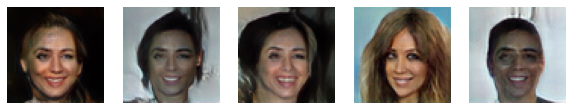

2550/5000: d_loss: 0.6756,  gan_loss: 0.9113


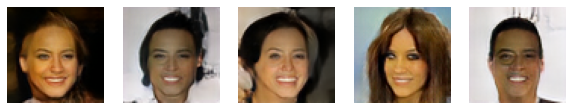

2600/5000: d_loss: 0.6595,  gan_loss: 0.8620


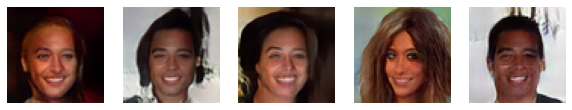

2650/5000: d_loss: 0.6780,  gan_loss: 0.7416


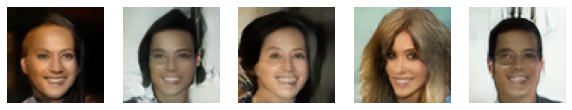

2700/5000: d_loss: 0.6844,  gan_loss: 0.8073


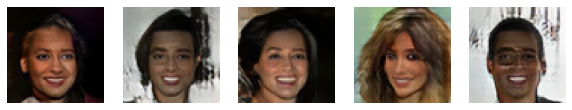

2750/5000: d_loss: 0.7273,  gan_loss: 0.9007


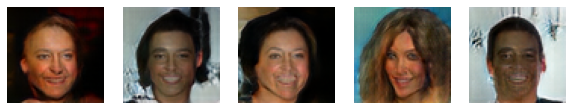

2800/5000: d_loss: 0.6819,  gan_loss: 0.7347


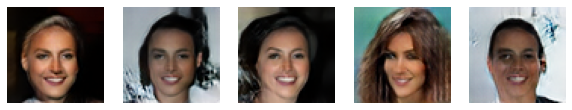

2850/5000: d_loss: 0.6761,  gan_loss: 0.7459


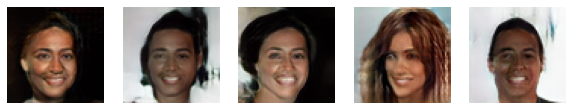

2900/5000: d_loss: 0.7006,  gan_loss: 0.7828


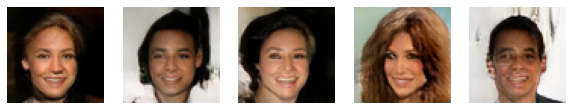

2950/5000: d_loss: 0.6830,  gan_loss: 0.8384


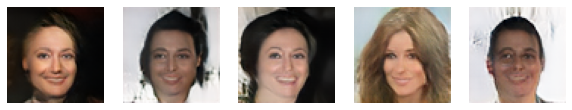

3000/5000: d_loss: 0.7117,  gan_loss: 0.9377


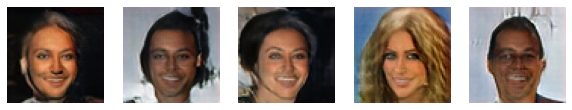

3050/5000: d_loss: 0.6751,  gan_loss: 0.7647


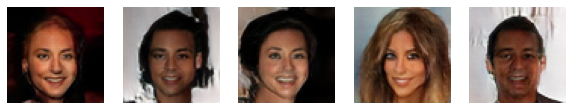

3100/5000: d_loss: 0.7015,  gan_loss: 0.8634


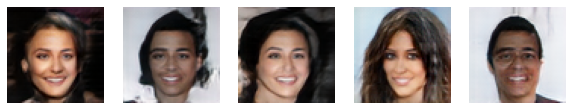

3150/5000: d_loss: 0.6508,  gan_loss: 0.9172


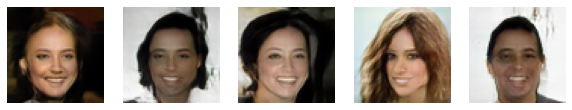

3200/5000: d_loss: 0.6718,  gan_loss: 0.8832


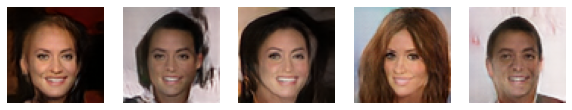

3250/5000: d_loss: 0.6710,  gan_loss: 0.7578


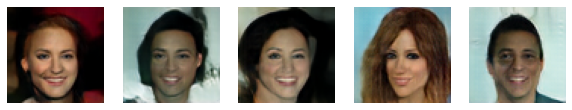

3300/5000: d_loss: 0.6783,  gan_loss: 0.8082


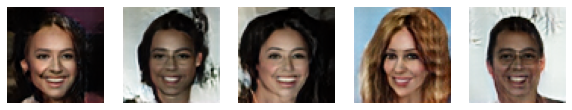

3350/5000: d_loss: 0.6950,  gan_loss: 0.8425


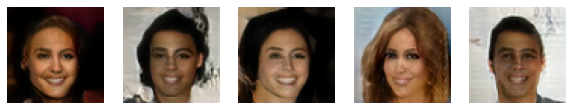

3400/5000: d_loss: 0.7199,  gan_loss: 0.7521


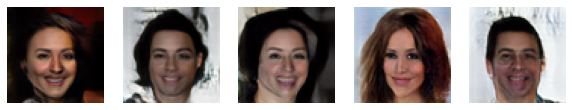

3450/5000: d_loss: 0.7005,  gan_loss: 0.8331


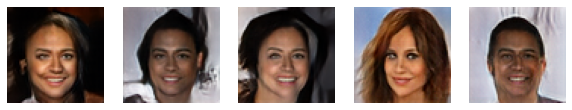

3500/5000: d_loss: 0.7847,  gan_loss: 0.7676


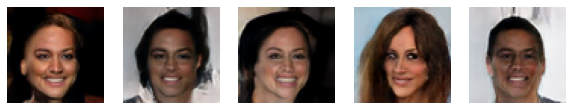

3550/5000: d_loss: 0.6888,  gan_loss: 0.8826


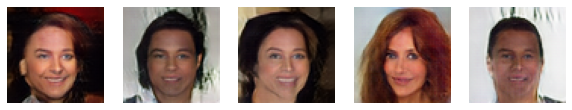

3600/5000: d_loss: 0.6838,  gan_loss: 0.8610


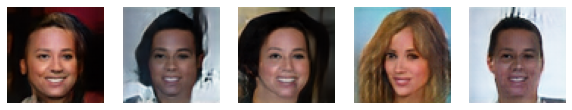

3650/5000: d_loss: 0.6769,  gan_loss: 0.8177


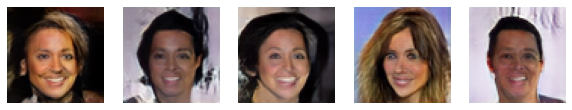

3700/5000: d_loss: 0.6869,  gan_loss: 0.7449


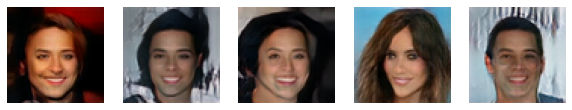

3750/5000: d_loss: 0.6536,  gan_loss: 0.8100


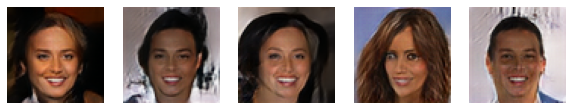

3800/5000: d_loss: 0.6792,  gan_loss: 0.8011


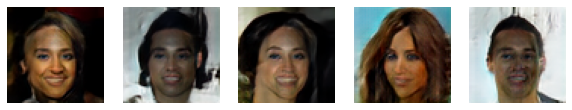

3850/5000: d_loss: 0.6776,  gan_loss: 0.8173


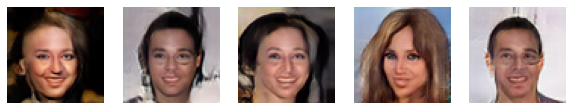

3900/5000: d_loss: 0.6466,  gan_loss: 0.8768


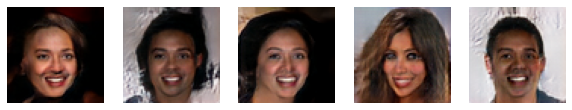

3950/5000: d_loss: 0.7153,  gan_loss: 0.8657


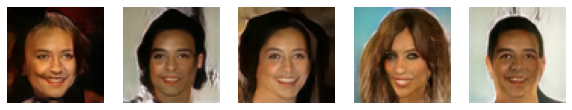

4000/5000: d_loss: 0.6828,  gan_loss: 0.9258


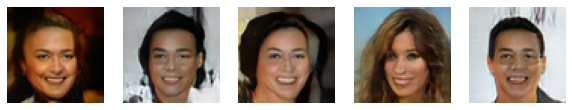

4050/5000: d_loss: 0.6709,  gan_loss: 0.7951


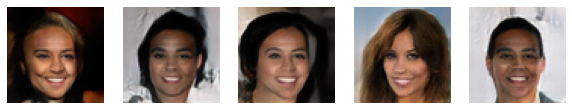

4100/5000: d_loss: 0.6584,  gan_loss: 0.6884


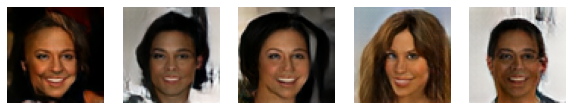

4150/5000: d_loss: 0.7039,  gan_loss: 0.7572


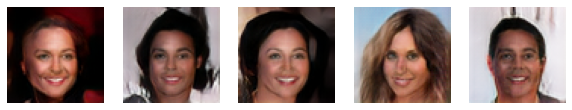

4200/5000: d_loss: 0.6993,  gan_loss: 0.8227


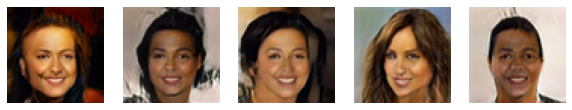

4250/5000: d_loss: 0.7054,  gan_loss: 0.8225


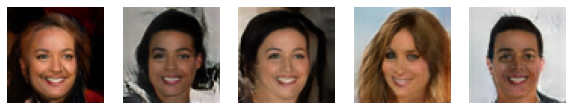

4300/5000: d_loss: 0.6678,  gan_loss: 0.7938


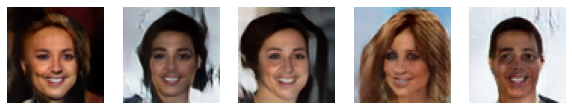

4350/5000: d_loss: 0.6061,  gan_loss: 1.0264


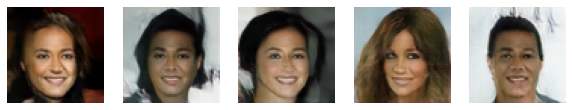

4400/5000: d_loss: 0.6987,  gan_loss: 0.7534


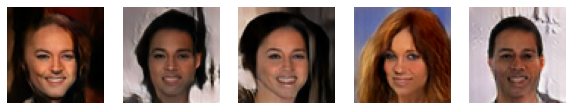

4450/5000: d_loss: 0.7244,  gan_loss: 0.9645


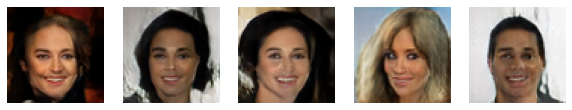

4500/5000: d_loss: 0.7206,  gan_loss: 0.9729


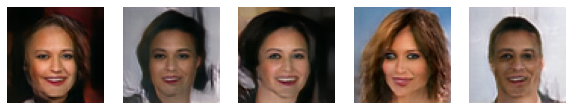

4550/5000: d_loss: 0.6996,  gan_loss: 0.9521


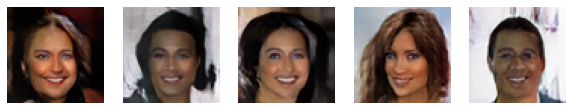

4600/5000: d_loss: 0.6666,  gan_loss: 0.7531


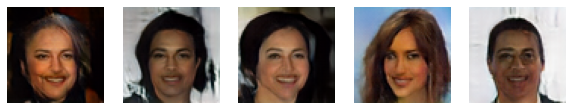

4650/5000: d_loss: 0.6707,  gan_loss: 0.8943


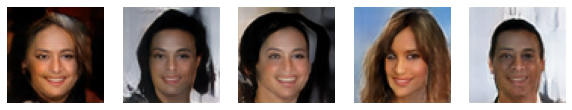

4700/5000: d_loss: 0.6529,  gan_loss: 0.8433


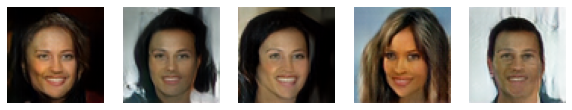

4750/5000: d_loss: 0.6691,  gan_loss: 0.6915


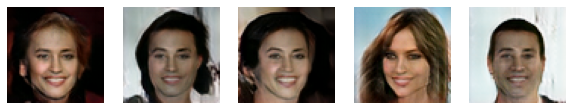

4800/5000: d_loss: 0.6532,  gan_loss: 0.7917


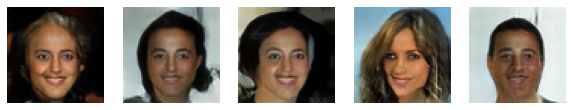

4850/5000: d_loss: 0.7028,  gan_loss: 0.7634


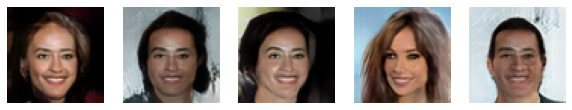

4900/5000: d_loss: 0.6768,  gan_loss: 0.9316


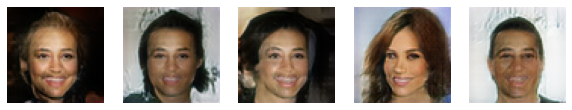

4950/5000: d_loss: 0.6721,  gan_loss: 0.8239


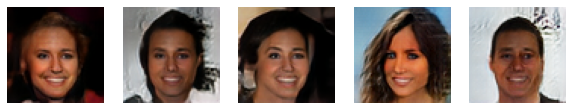

5000/5000: d_loss: 0.6777,  gan_loss: 0.7698


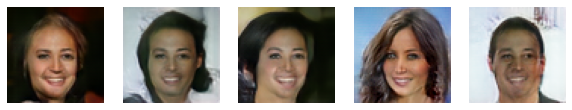

In [ ]:
EPOCHS = 5000
BATCH_SIZE = 32

# random vectors to generate images at the end of 50 epochs
test_vectors = np.random.normal(size = (5, Z_DIM)) / 2
start = 0

# iterate over the number of epochs
for step in range(EPOCHS):
  # sample noise vector
  noise_vectors = np.random.normal(size = (BATCH_SIZE, Z_DIM))
  # generate fake images
  fake_images = generator.predict(noise_vectors)
  # sample real images
  real_images = images[start:start + BATCH_SIZE]
  # combine fake and real images
  combined_images = np.concatenate([fake_images, real_images])

  # generate labels
  labels = np.concatenate([np.ones((BATCH_SIZE, 1)), np.zeros((BATCH_SIZE, 1))])
  # add small randomness to the labels for better training
  labels += .05 * np.random.random(labels.shape)

  # calculate the loss of discriminator
  d_loss = discriminator.train_on_batch(combined_images, labels)

  # sample noise vectors to fool the discriminator by feeding wrong labels
  noise_vectors = np.random.normal(size = (BATCH_SIZE, Z_DIM))
  wrong_labels = np.zeros((BATCH_SIZE, 1))

  # calculate the overall loss
  gan_loss = gan_model.train_on_batch(noise_vectors, wrong_labels)
  
  start += BATCH_SIZE
  if start > images.shape[0] - BATCH_SIZE:
    start = 0

  # generator performance visualization after every 50 epochs
  if step % 50 == 49:
    print('%d/%d: d_loss: %.4f,  gan_loss: %.4f' % (step + 1, EPOCHS, d_loss, gan_loss))
    
    fake_images = generator.predict(test_vectors)
    plt.figure(1, figsize = (10, 10))
    for i in range(5):
      plt.subplot(1, 5, i + 1)
      plt.imshow(np.clip(fake_images[i, :, :, :], 0, 255))
      plt.axis('off')
    plt.show()

## Visualize the generated images

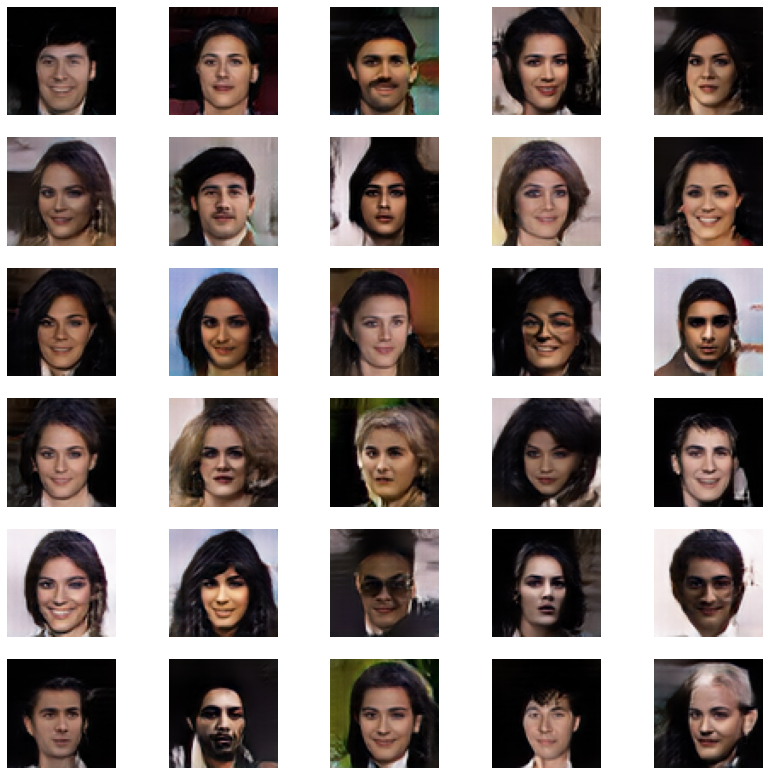

In [25]:
# sample test vectors
test_vectors = np.random.normal(size = (BATCH_SIZE, Z_DIM)) / 2

# generate images
fake_images = generator.predict(test_vectors)
plt.figure(1, figsize = (14, 14))
for i in range(30):
  plt.subplot(6, 5, i + 1)
  plt.imshow(np.clip(fake_images[i], 0, 255))
  plt.axis('off')
plt.show()

## Adding smiles

In [39]:
# Manually filter the images with and without smile
images_with_smile = [0, 3, 5, 8, 9, 10, 13, 15, 19, 20, 21, 24, 27]
images_without_smile = [1, 4, 6, 7, 14, 16, 17, 18, 22, 23, 28, 29]

# calculate the mean of random samples with and without smile
with_smile_mean = test_vectors[images_with_smile].mean(axis = 0)
without_smile_mean = test_vectors[images_without_smile].mean(axis = 0)

# calculate smile vector
smile_vector = with_smile_mean - without_smile_mean

# add smile vector to the original vector
random_smile_vector = test_vectors + smile_vector

# clip the values
random_smile_vector = random_smile_vector.clip(-1, 1)

In [ ]:
# generate images with smiles
faces_with_smile = generator.predict(random_smile_vector)

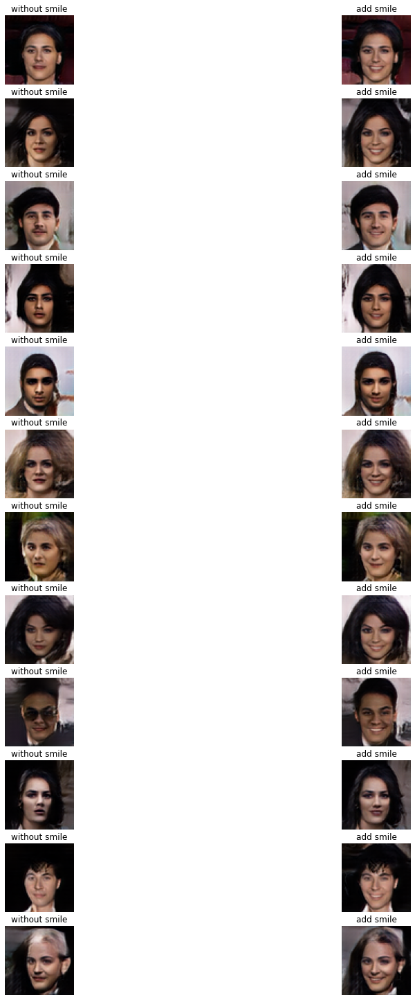

In [47]:


plt.figure(figsize = (16, 26))
for i, idx in enumerate(images_without_smile):
    plt.subplot(len(images_without_smile), 2, i * 2 + 1)
    plt.axis('off')
    plt.title("without smile")
    plt.imshow(np.clip(fake_images[images_without_smile[i]], 0, 255))
    plt.subplot(len(images_without_smile), 2, i * 2 + 2)
    plt.axis('off')
    plt.title("add smile")
    plt.imshow(np.clip(faces_with_smile[images_without_smile[i]], 0, 255))
plt.show()